In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import mat4py # .mat file conversion

from scipy.signal import welch, find_peaks, cwt # Signal Processing

import stumpy # Matrix Profile
from stumpy.floss import _cac # One sided cac

import ot # Optimal Transport

from vmdpy import VMD # Variational Mode Decomposition 

from ruptures.metrics import hausdorff # Quantifying Break Point Discrepancies

# Utils
import time
import os
loc = os.getcwd() 

# Matplotlib Params
import matplotlib
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 16}

matplotlib.rc('font', **font)

# os.chdir('/Users/wang_to/Documents/University/Anomaly_detection/anomalies/bookshelf/dataset')

from matplotlib import animation
from IPython.display import HTML
import scripts

os.chdir('/Users/wang_to/Documents/University/Anomaly_detection/anomalies/bookshelf/dataset')


In [34]:
import importlib
importlib.reload(scripts)

<module 'scripts' from '/Users/wang_to/Documents/University/Anomaly_detection/anomalies/bookshelf/code/streaming/scripts.py'>

# Current Notebook/Pipeline Structure
1.1 - Zero out data from data_dict 

1.2 - Replace with normal data.
Branches 
1. No vmd, only welch, sensor 1. use vmd = 0 in computing building_features and building_features_seq, then animate.
2. Yes vmd[0], sensor 1. Use vmd = num_modes to compute building_features and building_features_seq. Animate.
3. Yes vmd, sensor 1, cac all together
4. Yes vmd, all sensors, cac all sensors together (still to be done)



# Generic Preprocessing Steps (1.1)

In [51]:
data_dict = np.load('data_dict.npy', allow_pickle=True).item()
cases = [['L00','D00','V08'], ['L1C','DB0','V08'],  ['L1C','DBB','V08'], ['L13','DBB','V08']]

# for the first 8 sensors, erase some number of points between 100 and 500.
# for other experiments, see what happens if zeroing out is replaced by random normals
num_sensors = 8
bounds = (500, 1000)
rand_dict = {}

# for i in range(num_sensors):
#     sensor_str = f'Sensor{i+1}'
#     _, rand_positions = scripts.zero_out(data_dict[sensor_str], bounds, 8192, 270, zero=True, rand=True)
#     rand_dict[f'Sensor{i+1}'] = rand_positions 
    
df_list = scripts.exp_list_process(data_dict, cases, 10)

# actually - do the zeroing out after df_list


for i in range(num_sensors):
    sensor_str = f'Sensor{i+1}'
    _, rand_positions = scripts.zero_out(df_list[sensor_str], bounds, 8192, 25, zero=True, rand=True)
    rand_dict[f'Sensor{i+1}'] = rand_positions 
    
    # note: does it even make sense to get the positions? We just want to consider qualitative outputs.

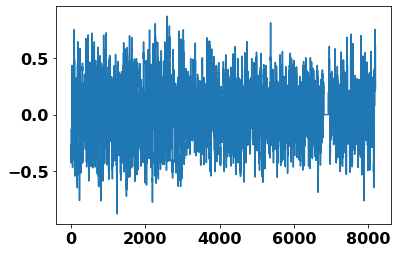

In [86]:
plt.plot(df_list['Sensor1'].iloc[21,:-4].values)

In [62]:
# parameters 

alpha = 2000      # Moderate bandwidth constraint  
tau = 0.          # Noise-tolerance (no strict fidelity enforcement)  
num_modes = 5     # Num modes  
DC = 0            # No DC part imposed  
init = 0          # Initialize omegas uniformly  
tol = 1e-7        # Optimization Convergence Tolerance
fs = 1600
# Parameter for p-welch transform
nperseg = df_list['Sensor1'].shape[1]//8

num_experiments = 25 

# Total length of signal recording
signal_length = 8192 # len(X_cols_time)



# Computing FLOSS algorithm for non-VMD (only welch) (1.1)

In [6]:
building_features = scripts.welch_vmd(df_list['Sensor1'])

In [7]:
building_features_seq = scripts.data_sequencing(building_features, vmd=0)

In [16]:
regime_change_idxs = [n_exp * 513 for n_exp in [10, 15, 20]]
m = 100
L = m
start_list_size = 5*513 

scripts.animate_regime_change(building_features_seq, 0, regime_change_idxs, start_list_size, m, L)

# Computing CAC FLOSS algorithm for VMD and VMD CAC (1.1), Sensor 1

In [21]:
building_features = scripts.welch_vmd(df_list, 8192, nperseg, fs, 5, alpha, tau, DC, init, tol)
# use these building features for all other cac experiments

Processing Sensor 1
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 2
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 3
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experiment Num (i.e. Data Row) 10
	Processed VMD for Experiment Num (i.e. Data Row) 15
	Processed VMD for Experiment Num (i.e. Data Row) 20
Processing Sensor 4
	Processed VMD for Experiment Num (i.e. Data Row) 0
	Processed VMD for Experiment Num (i.e. Data Row) 5
	Processed VMD for Experime

## VMD[0] CACs Sensor 1

In [25]:
building_features_seq = scripts.data_sequencing(building_features, vmd=5)

In [28]:
building_features_seq['Sensor1'][0]

array([ -9.72101702,  -9.49850496,  -9.43774908, ..., -21.33940062,
       -21.4698189 , -22.36446665])

In [32]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 0
start_list_size = 5 * 513
m = 100 
L = m
scripts.animate_regime_change(building_features_seq['Sensor1'][0], num_modes, regime_change_idxs, start_list_size, m, L)

# the key is a compact, moving structure - other peaks might be larger, but not consistent...
# how to formalise this idea?

## VMD[all] CACs Sensor 1

In [65]:
regime_change_idxs = [n_exp*513 for n_exp in [10, 15, 20]]
num_modes = 5
start_list_size = 5 * 513
m = 100 
L = m
scripts.animate_regime_change(building_features_seq['Sensor1'], num_modes, regime_change_idxs, start_list_size, m, L)

## VMD[all] CACs ALL SENSORS

In [ ]:
cac_list = [] #to store the initial cacs for each mode 

stream = dict()

#initialising and also setting up streaming objects for each mode
for mode in range(num_modes): 
    old_data = building_features_seq[mode][:513*5] # take the first 5 experiments. There are 25 experiments, with changes occuring in 10, 15, 20 
    mp = stumpy.stump(old_data, m=m)
    cac_list.append(_cac(mp[:, 3], L, bidirectional=False, excl_factor=1))
    vmd_str = f'vmd{mode}'
    stream[vmd_str] = stumpy.floss(mp, old_data, m=m, L=L, excl_factor=1)

cac_list= np.array(cac_list)
#OT layer 1 for initial data ( first five experiments)
sub_sample_rate = 10

A = cac_list.T
B = A[::sub_sample_rate,:] # Sub-sampling to increase OT processing
M = ot.utils.dist0(B.shape[0]) # Ground Metric 
M /= M.max()  # Normalizing ground metric 
M*=1e+4 # Tuning ground metric for problem (hyper-param)

bary_wass = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) # reg - Entropic Regularization 

cac_1d = np.repeat(bary_wass,10)

windows = []

# regime_change_idxs = []
# for n_exp in [10,15,20]:
#     regime_change_idxs.append(n_exp*513)

current_x_window = list(np.arange(start_list_size))


num_sensors = 24

for j in num_sensors:
    sensor_str = f'Sensor{j}'
    new_data = building_features_seq[sensor_str].T[start_list_size:] 

    for i, t in enumerate(new_data): 
        #update the window of x values we are currently looking at CAC for
        current_x_window = current_x_window[1:]
        current_x_window.append(i+start_list_size)

        cac_list = dict()

        for mode in range(num_modes): # cac_list is a dict sensor_str: array of vmd cacs. First barycenter cacs then barycenter across sensors to produce a single cac
            stream[sensor_str] = dict()
            vmd_str = f'vmd{mode}'
            stream[sensor_str][vmd_str].update(t[mode])
            cac_list[sensor_str] = []
            cac_list[sensor_str].append(stream[sensor_str][vmd_str].cac_1d_)
        cac_list[sensor_str] = np.array(cac_list)

        if i % 100 == 0: # every 100 points, update the CAC, barycenter the CACs together for the vmd, then barycenter the sensors together
            #note any indices of regime changes in this x values window
            regime_changes_window_idxs = [0]
            for change in regime_change_idxs:
                if change in current_x_window:
                    regime_changes_window_idxs.append(current_x_window.index(change))
                    
            #layer 1 pooling over modes
            sub_sample_rate = 10 #for fast OT processing
            A = cac_list.T
            B = A[::sub_sample_rate,:] # Sub-sampling to increase OT processing
            M = ot.utils.dist0(B.shape[0]) # Ground Metric 
            M /= M.max()  # Normalizing ground metric 
            M*=1e+4 # Tuning ground metric for problem (hyper-param)

            bary_wass = ot.barycenter_unbalanced(B, M, reg=5e-4, reg_m=1e-1) # reg - Entropic Regularization 

            current_cac_1d = np.repeat(bary_wass,10)
            # .T_ produces the sliding window used to create the data
    
    windows.append((stream['vmd1'].T_, current_cac_1d, regime_changes_window_idxs)) # this is currently taking the first vmd...


fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0})

axs[0].set_xlim((0, len(current_x_window)))
Y_MIN = np.min(building_features_seq[0])
Y_MAX = np.max(building_features_seq[0])
axs[0].set_ylim(Y_MIN, Y_MAX)
axs[1].set_xlim((0, len(current_x_window)))
axs[1].set_ylim((-0.1, 1.1))

lines = []

for ax in axs: #create empty structures for each frame
    line, = ax.plot([], [], lw=2)
    lines.append(line)
    line, = ax.plot([],[], linewidth=2, color= 'red')
    lines.append(line)
line, = axs[1].plot([], [], lw=2) # create structure for orange curve
lines.append(line)

def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(window):
    data_out, cac_out, regime_changes = window
    lines[0].set_data(np.arange(data_out.shape[0]), data_out)
    lines[2].set_data(np.arange(cac_out.shape[0]), cac_out)
    rgm_change = max(regime_changes)
    lines[1].set_data([rgm_change,rgm_change],[Y_MIN, Y_MAX])
    lines[3].set_data([rgm_change,rgm_change],[-0.1, 1.1])
    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                            frames=windows, interval=100,
                            blit=True)

anim_out = anim.to_jshtml()
plt.close()  # Prevents duplicate image from displaying

HTML(anim_out)

# CAC BREAKDOWN
- ideas
- zeros
- step_function 
